In [1]:
import os
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import numpy as np
import cv2
from PIL import Image
from glob import glob
import skimage.io as io
import shutil

import torch
from torch import nn
from torch.optim import Adam
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
import torchvision as tv
import torch.nn.functional as F
from torch import Tensor

In [2]:
current_path = os.getcwd()
converted_path = current_path.replace('/', '\\')
print(converted_path)

\home\duong\git\DecodeItAll\bio_seman_seg\rattunet\sessile-main-Kvasir-SEG


In [3]:
bio_seg_dir = "/".join(converted_path.split("\\")[:-2])
print(bio_seg_dir)
print(os.path.exists(bio_seg_dir))

/home/duong/git/DecodeItAll/bio_seman_seg
True


In [4]:
data_dir = bio_seg_dir + "/dataset/sessile-main-Kvasir-SEG"
print(os.listdir(data_dir))

['masks', 'images']


In [5]:
img_dir = data_dir + "/images"
msk_dir = data_dir + "/masks"

print(f"No. Img: {len(os.listdir(img_dir))}")
print(f"No. Msk: {len(os.listdir(msk_dir))}")

No. Img: 196
No. Msk: 196


In [6]:
class PolypDataset(Dataset):
    def __init__(self, transform = None, target_transform = None):
        from glob import glob
        self.imgs = sorted(glob(img_dir + "/*"))
        self.msks = sorted(glob(msk_dir + "/*"))
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        img_path = self.imgs[idx]
        msk_path = self.msks[idx]

        img = Image.open(img_path)
        msk = Image.open(msk_path)

        if self.transform:
            img = self.transform(img)

        if self.target_transform:
            msk = self.target_transform(msk)

        return (img, msk)

In [7]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize((0.5757, 0.3280, 0.2384), (0.3077, 0.2093, 0.1699))
])

target_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

ds = PolypDataset(transform=transform, target_transform=target_transform)
train_ds, test_ds = random_split(ds, [0.8, 0.2])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


157


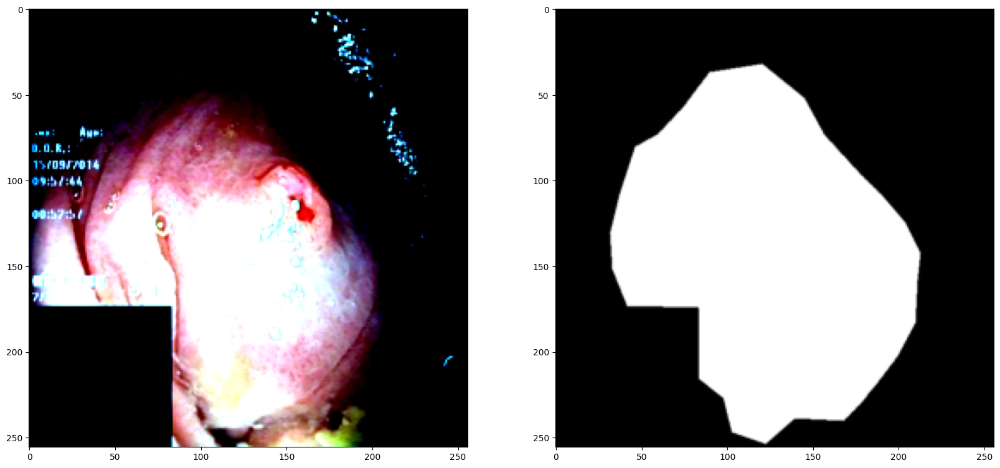

In [8]:
print(len(train_ds))

img, msk = train_ds[25]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 20))

ax1.imshow(img.permute(1, -1, 0).numpy())
ax2.imshow(msk.permute(1, -1, 0).numpy(), cmap = 'gray')

In [9]:
train_dl = DataLoader(train_ds, batch_size=20, shuffle=True)

print(len(train_dl))

8


In [10]:
class Attention_block(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super(Attention_block, self).__init__()

        self.W_g = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        self.W_x = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )

        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        g1 = self.W_g(g)
        x1 = self.W_x(x)
        psi = self.relu(g1 + x1)
        psi = self.psi(psi)
        out = x * psi
        return out

In [11]:
class Recurrent_block(nn.Module):
    def __init__(self, out_ch, t=2):
        super(Recurrent_block, self).__init__()

        self.t = t
        self.out_ch = out_ch
        self.conv = nn.Sequential(
            nn.Conv2d(out_ch, out_ch, kernel_size=3, stride=1, padding=1, bias=True),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        out = 0
        for i in range(self.t):
            if i == 0:
                x = self.conv(x)
            out = self.conv(x + x)
        return out


class RRCNN_block(nn.Module):
    def __init__(self, in_ch, out_ch, t=2):
        super(RRCNN_block, self).__init__()

        self.RCNN = nn.Sequential(
            Recurrent_block(out_ch, t=t),
            Recurrent_block(out_ch, t=t)
        )
        self.Conv = nn.Conv2d(in_ch, out_ch, kernel_size=1, stride=1, padding=0)

    def forward(self, x):
        x1 = self.Conv(x)
        x2 = self.RCNN(x1)
        out = x1 + x2
        return out

class up_conv(nn.Module):
    def __init__(self, in_ch, out_ch):
        super(up_conv, self).__init__()
        self.up = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(in_ch, out_ch, kernel_size=3, stride=1, padding=1, bias=True),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.up(x)
        return x

In [12]:
class R2AttU_Net(nn.Module):
    def __init__(self, in_ch=3, out_ch=3, t=2, init_channels = 16):
        super(R2AttU_Net, self).__init__()

        n1 = init_channels
        filters = [n1, n1 * 2, n1 * 4, n1 * 8, n1 * 16]

        self.Maxpool1 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.Maxpool2 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.Maxpool3 = nn.MaxPool2d(kernel_size=2, stride=2)
        self.Maxpool4 = nn.MaxPool2d(kernel_size=2, stride=2)

        self.RRCNN1 = RRCNN_block(in_ch, filters[0], t=t)
        self.RRCNN2 = RRCNN_block(filters[0], filters[1], t=t)
        self.RRCNN3 = RRCNN_block(filters[1], filters[2], t=t)
        self.RRCNN4 = RRCNN_block(filters[2], filters[3], t=t)
        self.RRCNN5 = RRCNN_block(filters[3], filters[4], t=t)

        self.Up5 = up_conv(filters[4], filters[3])
        self.Att5 = Attention_block(F_g=filters[3], F_l=filters[3], F_int=filters[2])
        self.Up_RRCNN5 = RRCNN_block(filters[4], filters[3], t=t)

        self.Up4 = up_conv(filters[3], filters[2])
        self.Att4 = Attention_block(F_g=filters[2], F_l=filters[2], F_int=filters[1])
        self.Up_RRCNN4 = RRCNN_block(filters[3], filters[2], t=t)

        self.Up3 = up_conv(filters[2], filters[1])
        self.Att3 = Attention_block(F_g=filters[1], F_l=filters[1], F_int=filters[0])
        self.Up_RRCNN3 = RRCNN_block(filters[2], filters[1], t=t)

        self.Up2 = up_conv(filters[1], filters[0])
        self.Att2 = Attention_block(F_g=filters[0], F_l=filters[0], F_int=32)
        self.Up_RRCNN2 = RRCNN_block(filters[1], filters[0], t=t)

        self.Conv = nn.Conv2d(filters[0], out_ch, kernel_size=1, stride=1, padding=0)


    def forward(self, x):

        e1 = self.RRCNN1(x)

        e2 = self.Maxpool1(e1)
        e2 = self.RRCNN2(e2)

        e3 = self.Maxpool2(e2)
        e3 = self.RRCNN3(e3)

        e4 = self.Maxpool3(e3)
        e4 = self.RRCNN4(e4)

        e5 = self.Maxpool4(e4)
        e5 = self.RRCNN5(e5)

        d5 = self.Up5(e5)
        e4 = self.Att5(g=d5, x=e4)
        d5 = torch.cat((e4, d5), dim=1)
        d5 = self.Up_RRCNN5(d5)

        d4 = self.Up4(d5)
        e3 = self.Att4(g=d4, x=e3)
        d4 = torch.cat((e3, d4), dim=1)
        d4 = self.Up_RRCNN4(d4)

        d3 = self.Up3(d4)
        e2 = self.Att3(g=d3, x=e2)
        d3 = torch.cat((e2, d3), dim=1)
        d3 = self.Up_RRCNN3(d3)

        d2 = self.Up2(d3)
        e1 = self.Att2(g=d2, x=e1)
        d2 = torch.cat((e1, d2), dim=1)
        d2 = self.Up_RRCNN2(d2)

        out = self.Conv(d2)

        return out

In [13]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu", index = 0)

model = R2AttU_Net(3, 1, False).to(device)

optimizer = Adam(params = model.parameters(), lr = 0.001)

epochs = 100

loss_fn = nn.BCEWithLogitsLoss()

In [14]:
old_loss = 1e26
best_dct = None
last_dct = None
for epoch in range(epochs):
    model.train()
    tr_total_loss = 0
    tr_total_dice = 0
    tr_total_iou = 0
    for train_img, train_mask in tqdm(train_dl):
        train_img = train_img.to(device)
        train_mask = train_mask.to(device)

        train_gen_mask = model(train_img)        
        train_loss = loss_fn(train_gen_mask, train_mask)

        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()        
        
        tr_total_loss += train_loss.cpu().item()        
            
    mean_train_loss = tr_total_loss/len(train_dl)

    if mean_train_loss <= old_loss:
        old_loss = mean_train_loss
        best_dct = model.state_dict()
    
    last_dct = model.state_dict()

    print(f"Epoch: {epoch} - TrainLoss: {mean_train_loss}")
model.load_state_dict(best_dct)

100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:02<00:00,  3.33it/s]


Epoch: 0 - TrainLoss: 0.5922845602035522


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.84it/s]


Epoch: 1 - TrainLoss: 0.5237609408795834


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.85it/s]


Epoch: 2 - TrainLoss: 0.46496396511793137


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.91it/s]


Epoch: 3 - TrainLoss: 0.41181008890271187


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.78it/s]


Epoch: 4 - TrainLoss: 0.36247431114315987


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.87it/s]


Epoch: 5 - TrainLoss: 0.32070254161953926


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.84it/s]


Epoch: 6 - TrainLoss: 0.2854429520666599


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.86it/s]


Epoch: 7 - TrainLoss: 0.26189751736819744


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.81it/s]


Epoch: 8 - TrainLoss: 0.24302575178444386


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.87it/s]


Epoch: 9 - TrainLoss: 0.2293733898550272


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.97it/s]


Epoch: 10 - TrainLoss: 0.2242248561233282


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.86it/s]


Epoch: 11 - TrainLoss: 0.21985779143869877


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.89it/s]


Epoch: 12 - TrainLoss: 0.21615067683160305


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.89it/s]


Epoch: 13 - TrainLoss: 0.215337622910738


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.92it/s]


Epoch: 14 - TrainLoss: 0.2142658345401287


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.86it/s]


Epoch: 15 - TrainLoss: 0.21232952736318111


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.97it/s]


Epoch: 16 - TrainLoss: 0.2102399580180645


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.88it/s]


Epoch: 17 - TrainLoss: 0.20924216508865356


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.82it/s]


Epoch: 18 - TrainLoss: 0.21346713230013847


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.82it/s]


Epoch: 19 - TrainLoss: 0.20952844433486462


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.82it/s]


Epoch: 20 - TrainLoss: 0.20944594778120518


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.89it/s]


Epoch: 21 - TrainLoss: 0.20706402137875557


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.84it/s]


Epoch: 22 - TrainLoss: 0.20620978623628616


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.79it/s]


Epoch: 23 - TrainLoss: 0.20708494633436203


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.77it/s]


Epoch: 24 - TrainLoss: 0.2067579422146082


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.91it/s]


Epoch: 25 - TrainLoss: 0.203981077298522


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.92it/s]


Epoch: 26 - TrainLoss: 0.2039881944656372


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.96it/s]


Epoch: 27 - TrainLoss: 0.20248381979763508


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.89it/s]


Epoch: 28 - TrainLoss: 0.20625336654484272


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.90it/s]


Epoch: 29 - TrainLoss: 0.20244858041405678


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.74it/s]


Epoch: 30 - TrainLoss: 0.20396527834236622


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.78it/s]


Epoch: 31 - TrainLoss: 0.19828526861965656


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.79it/s]


Epoch: 32 - TrainLoss: 0.19931736961007118


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.73it/s]


Epoch: 33 - TrainLoss: 0.1993676759302616


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.80it/s]


Epoch: 34 - TrainLoss: 0.19834011979401112


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.87it/s]


Epoch: 35 - TrainLoss: 0.19674432277679443


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.80it/s]


Epoch: 36 - TrainLoss: 0.19836813770234585


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.73it/s]


Epoch: 37 - TrainLoss: 0.19858839735388756


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.89it/s]


Epoch: 38 - TrainLoss: 0.1965548563748598


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.86it/s]


Epoch: 39 - TrainLoss: 0.19642874412238598


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.79it/s]


Epoch: 40 - TrainLoss: 0.19520608335733414


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.82it/s]


Epoch: 41 - TrainLoss: 0.19741995818912983


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.87it/s]


Epoch: 42 - TrainLoss: 0.19367599673569202


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.85it/s]


Epoch: 43 - TrainLoss: 0.19867347553372383


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.83it/s]


Epoch: 44 - TrainLoss: 0.19777642749249935


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.75it/s]


Epoch: 45 - TrainLoss: 0.192750234156847


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.87it/s]


Epoch: 46 - TrainLoss: 0.19146844372153282


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.86it/s]


Epoch: 47 - TrainLoss: 0.19242253340780735


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.88it/s]


Epoch: 48 - TrainLoss: 0.1910819076001644


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.80it/s]


Epoch: 49 - TrainLoss: 0.187120096758008


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.81it/s]


Epoch: 50 - TrainLoss: 0.20074579678475857


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.87it/s]


Epoch: 51 - TrainLoss: 0.19856563583016396


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.83it/s]


Epoch: 52 - TrainLoss: 0.193661879748106


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.82it/s]


Epoch: 53 - TrainLoss: 0.19064735621213913


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.86it/s]


Epoch: 54 - TrainLoss: 0.19114975258708


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.86it/s]


Epoch: 55 - TrainLoss: 0.18923885188996792


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.85it/s]


Epoch: 56 - TrainLoss: 0.18686677142977715


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.81it/s]


Epoch: 57 - TrainLoss: 0.18467061035335064


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.86it/s]


Epoch: 58 - TrainLoss: 0.18761848472058773


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.78it/s]


Epoch: 59 - TrainLoss: 0.1842276994138956


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.89it/s]


Epoch: 60 - TrainLoss: 0.18654845841228962


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.75it/s]


Epoch: 61 - TrainLoss: 0.18905186466872692


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.85it/s]


Epoch: 62 - TrainLoss: 0.1822291687130928


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.72it/s]


Epoch: 63 - TrainLoss: 0.18163011595606804


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.85it/s]


Epoch: 64 - TrainLoss: 0.1822442226111889


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.86it/s]


Epoch: 65 - TrainLoss: 0.17729316279292107


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.94it/s]


Epoch: 66 - TrainLoss: 0.18078657984733582


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.80it/s]


Epoch: 67 - TrainLoss: 0.18585997819900513


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.86it/s]


Epoch: 68 - TrainLoss: 0.18123954068869352


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.80it/s]


Epoch: 69 - TrainLoss: 0.18184348568320274


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.81it/s]


Epoch: 70 - TrainLoss: 0.18565434031188488


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.78it/s]


Epoch: 71 - TrainLoss: 0.1786540523171425


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.75it/s]


Epoch: 72 - TrainLoss: 0.1829291693866253


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.88it/s]


Epoch: 73 - TrainLoss: 0.17571492120623589


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.83it/s]


Epoch: 74 - TrainLoss: 0.17981351539492607


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.75it/s]


Epoch: 75 - TrainLoss: 0.17175112292170525


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.75it/s]


Epoch: 76 - TrainLoss: 0.1777114737778902


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.88it/s]


Epoch: 77 - TrainLoss: 0.17586696706712246


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.80it/s]


Epoch: 78 - TrainLoss: 0.17622678820043802


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.79it/s]


Epoch: 79 - TrainLoss: 0.18101622350513935


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.91it/s]


Epoch: 80 - TrainLoss: 0.17764663137495518


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.85it/s]


Epoch: 81 - TrainLoss: 0.17737183347344398


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.87it/s]


Epoch: 82 - TrainLoss: 0.17876767553389072


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.81it/s]


Epoch: 83 - TrainLoss: 0.17288054153323174


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.90it/s]


Epoch: 84 - TrainLoss: 0.17114745825529099


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.83it/s]


Epoch: 85 - TrainLoss: 0.1719032321125269


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.93it/s]


Epoch: 86 - TrainLoss: 0.17243243008852005


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.87it/s]


Epoch: 87 - TrainLoss: 0.16556847654283047


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.82it/s]


Epoch: 88 - TrainLoss: 0.1709334496408701


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.81it/s]


Epoch: 89 - TrainLoss: 0.16742855124175549


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.78it/s]


Epoch: 90 - TrainLoss: 0.16877196915447712


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.90it/s]


Epoch: 91 - TrainLoss: 0.1668670205399394


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.91it/s]


Epoch: 92 - TrainLoss: 0.1639479249715805


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.80it/s]


Epoch: 93 - TrainLoss: 0.16197875514626503


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.81it/s]


Epoch: 94 - TrainLoss: 0.161813385784626


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.81it/s]


Epoch: 95 - TrainLoss: 0.1711529614403844


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.72it/s]


Epoch: 96 - TrainLoss: 0.16811990924179554


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.76it/s]


Epoch: 97 - TrainLoss: 0.16747904755175114


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.80it/s]


Epoch: 98 - TrainLoss: 0.16162025090306997


100%|███████████████████████████████████████████████████████████████████████| 8/8 [00:01<00:00,  7.90it/s]

Epoch: 99 - TrainLoss: 0.16473973728716373


<All keys matched successfully>

In [22]:
test_dl = DataLoader(test_ds, batch_size=1, shuffle=True)

print(len(test_dl))

39


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


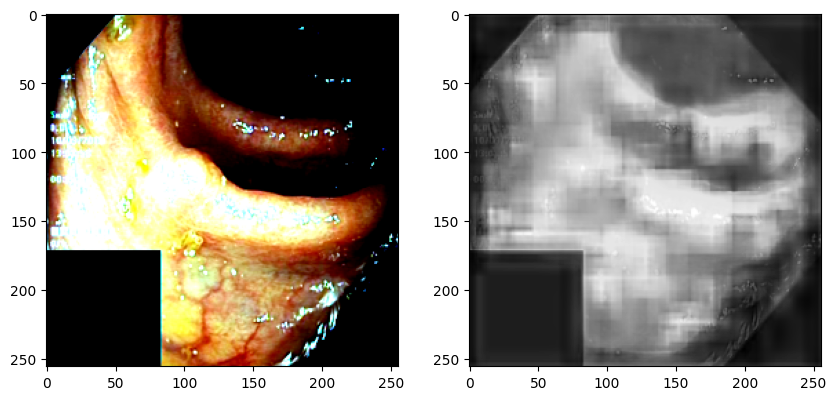

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


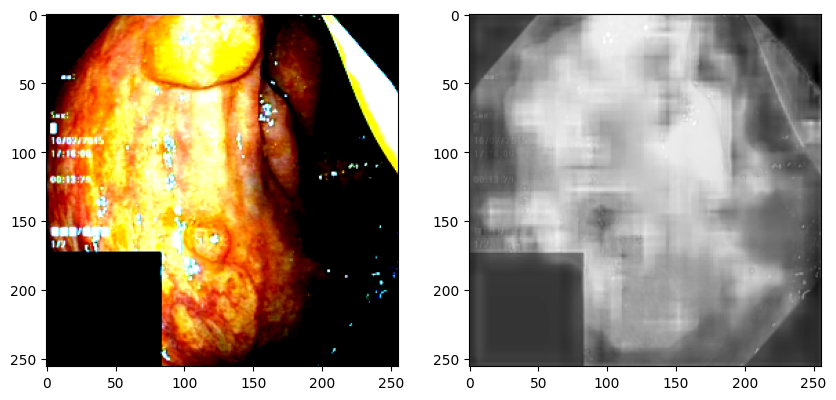

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


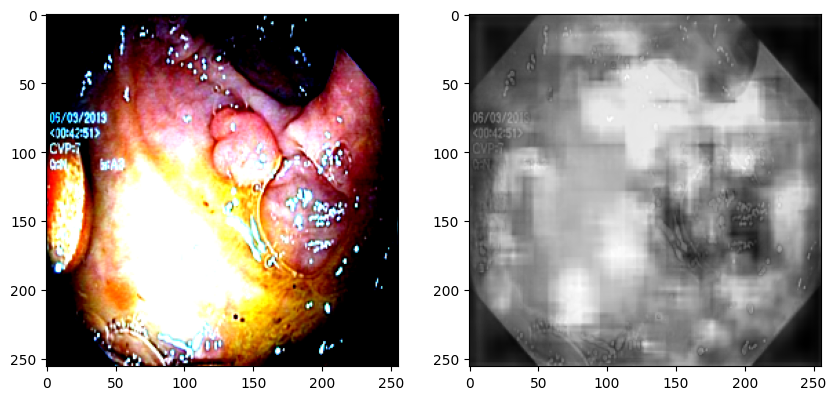

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


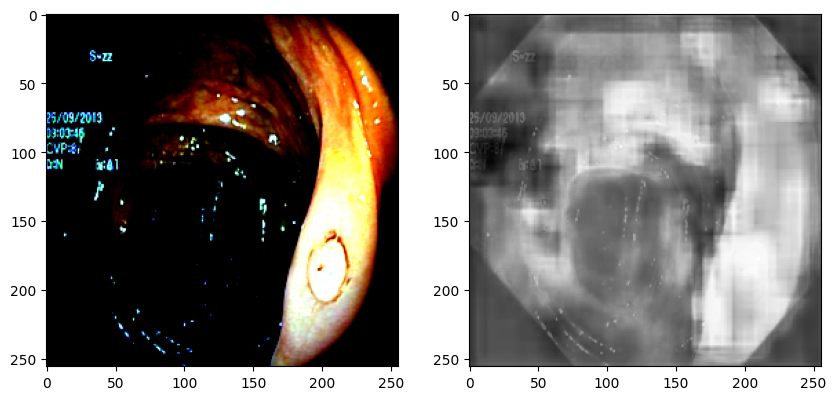

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


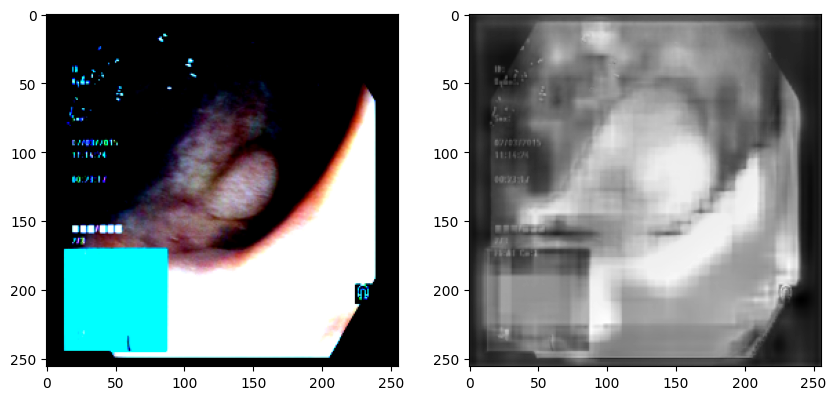

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


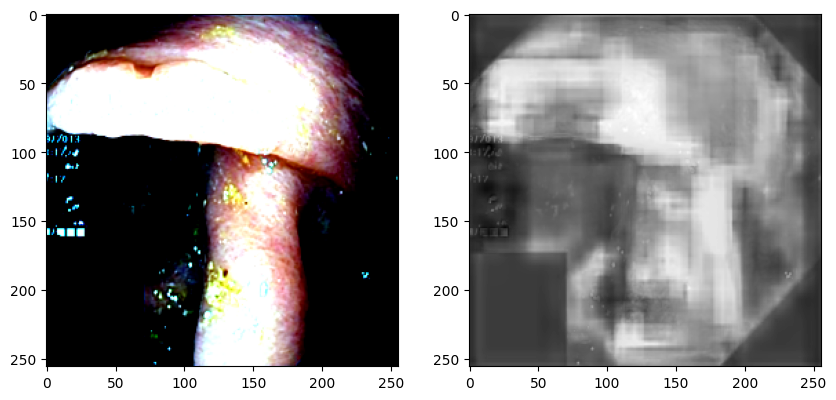

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


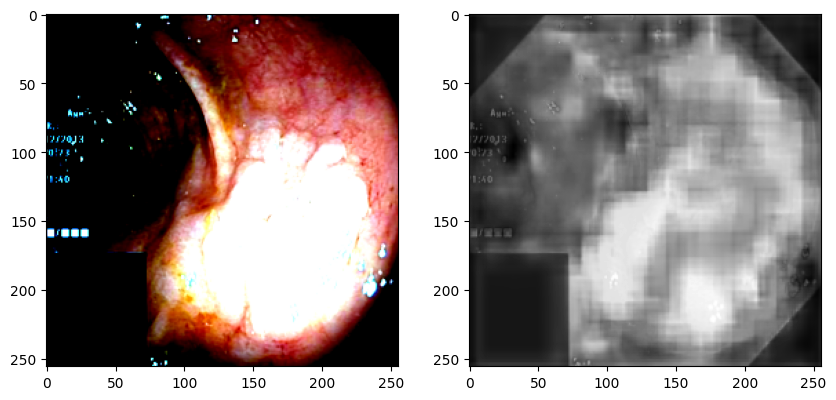

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


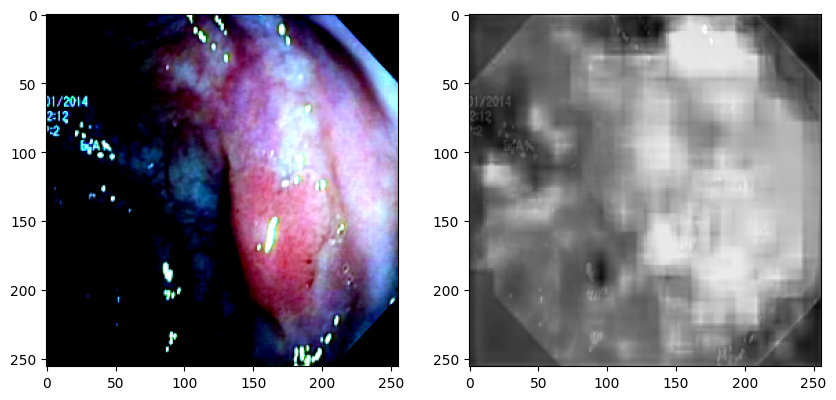

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


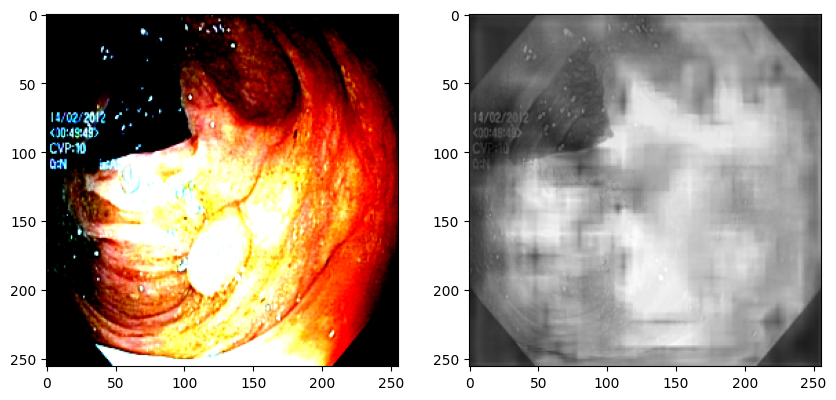

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


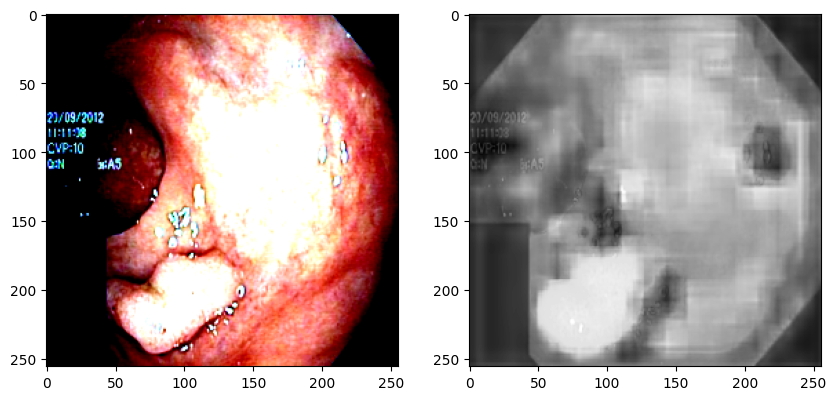

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


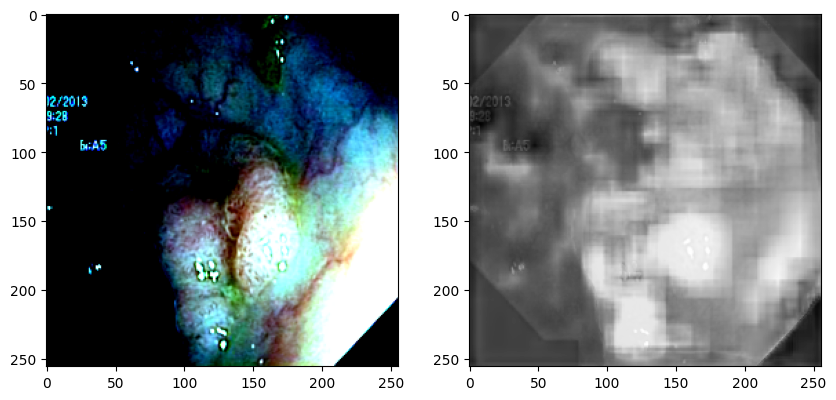

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


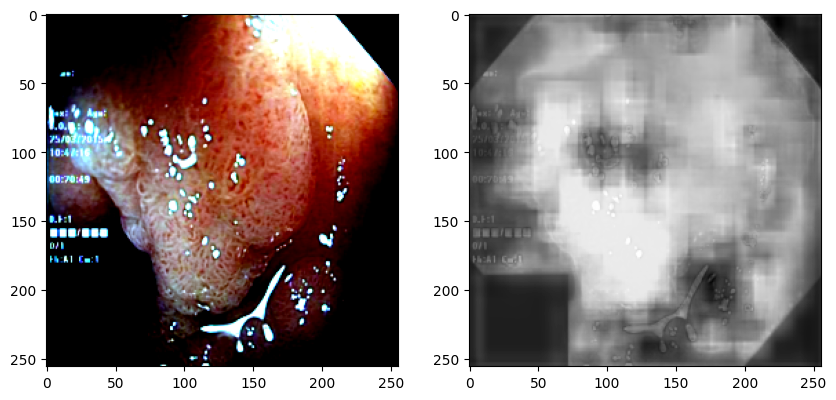

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


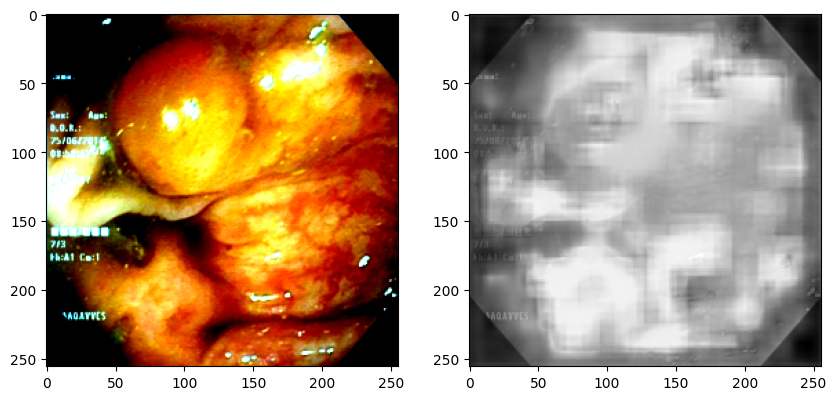

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


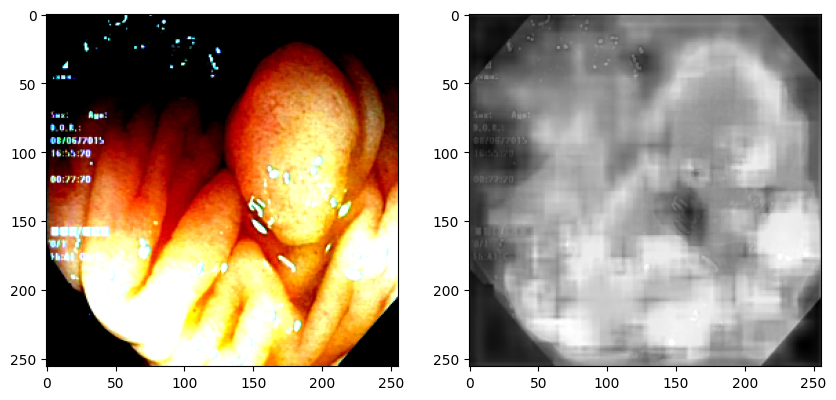

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


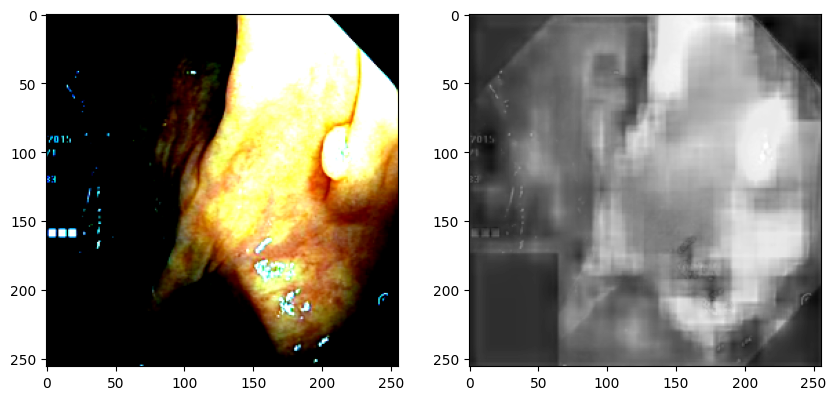

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


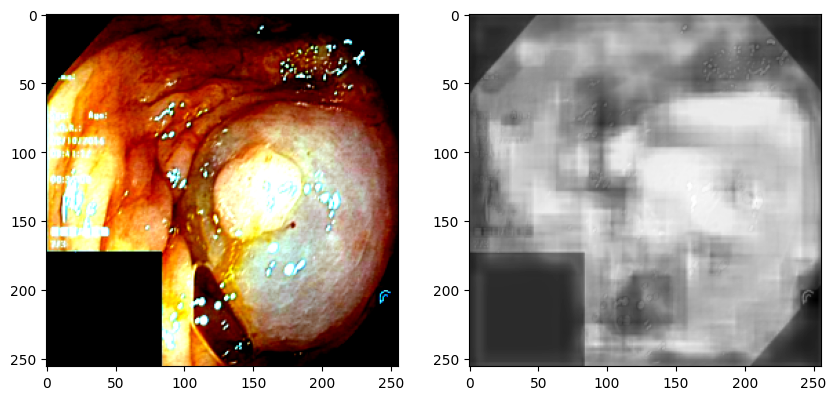

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


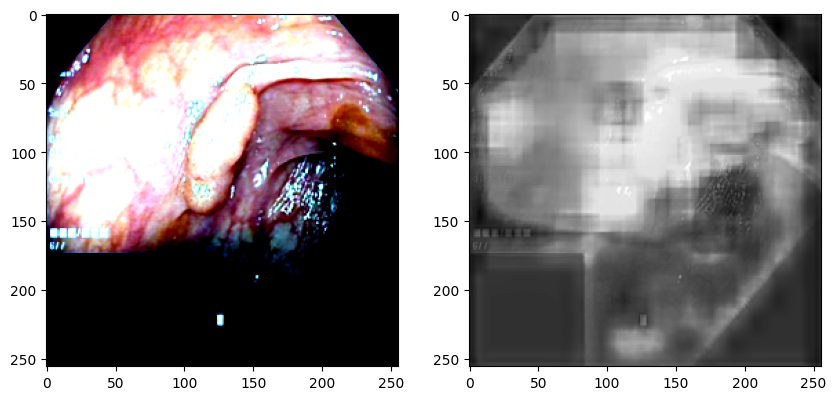

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


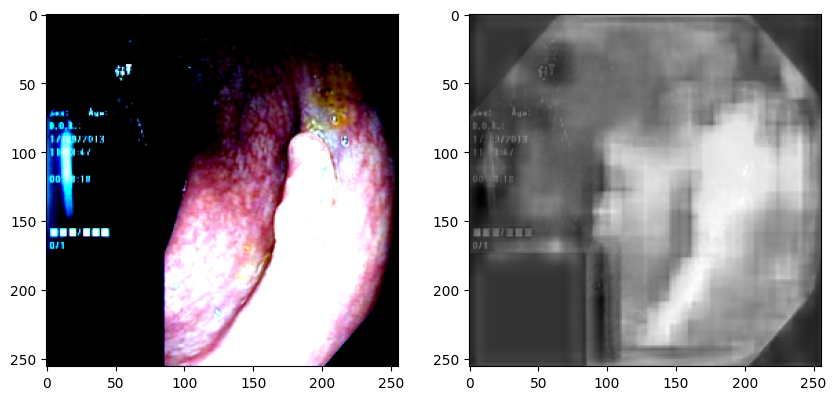

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


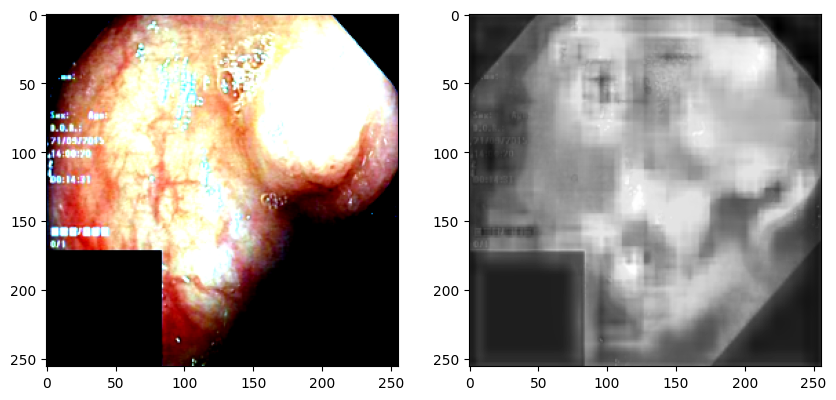

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


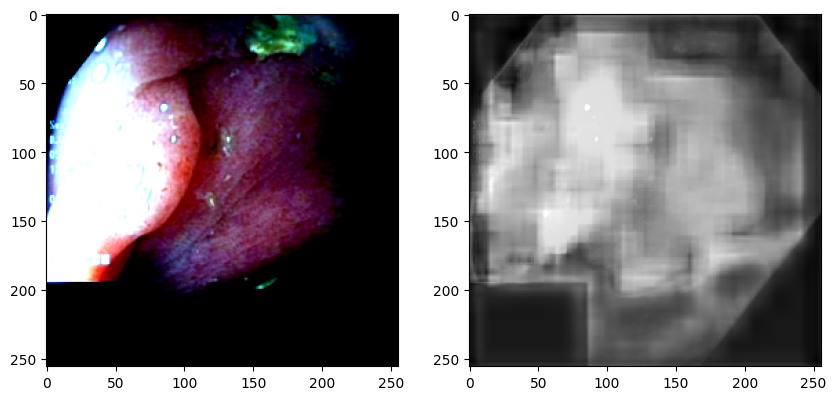

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


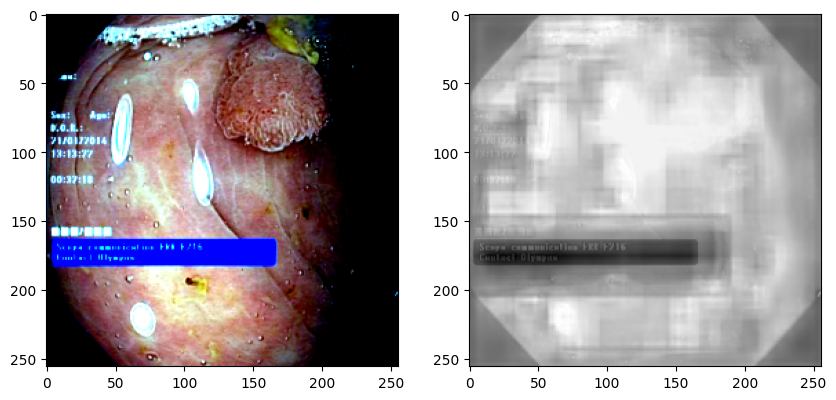

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


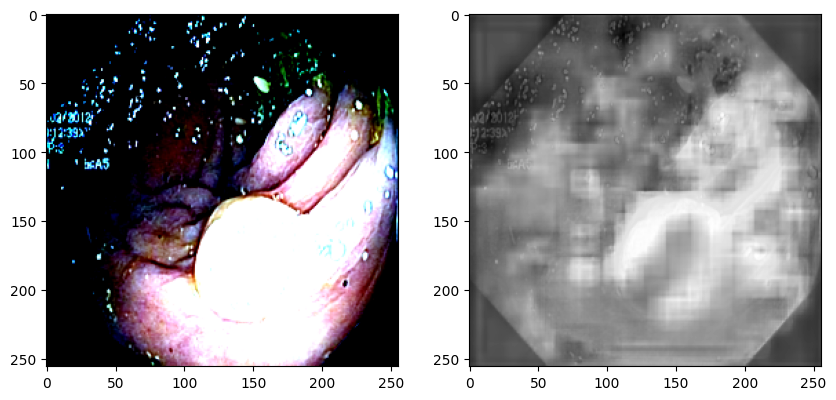

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


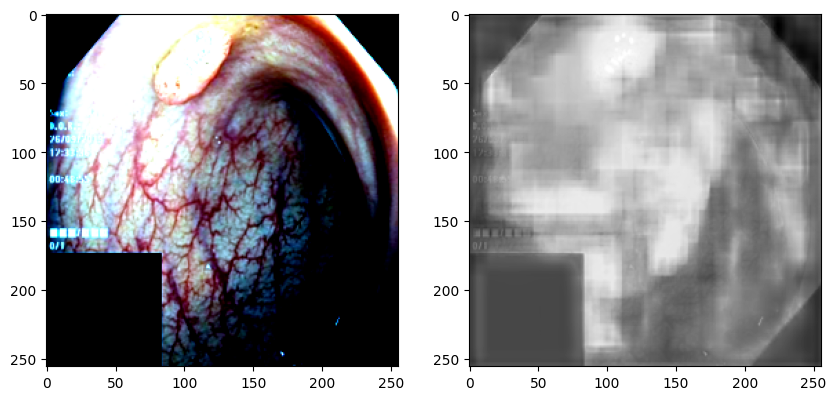

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


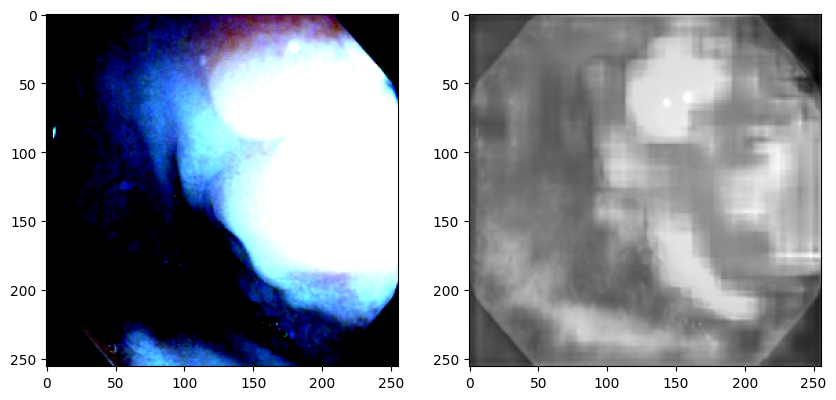

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


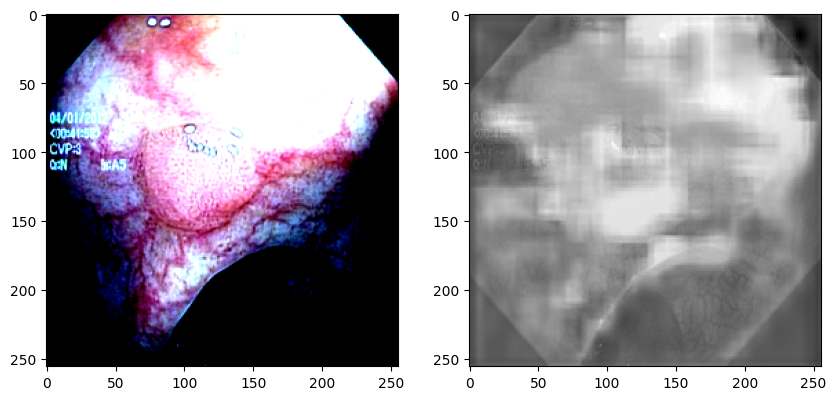

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


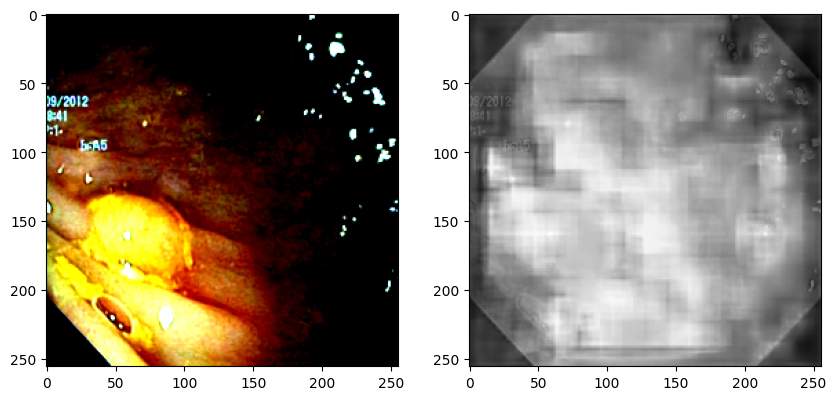

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


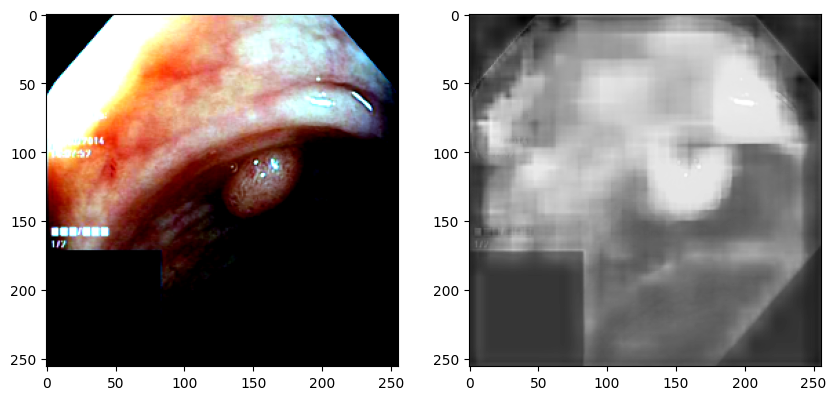

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


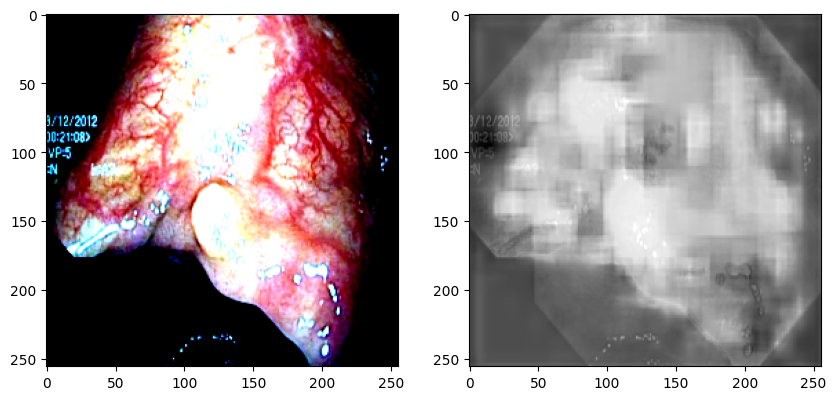

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


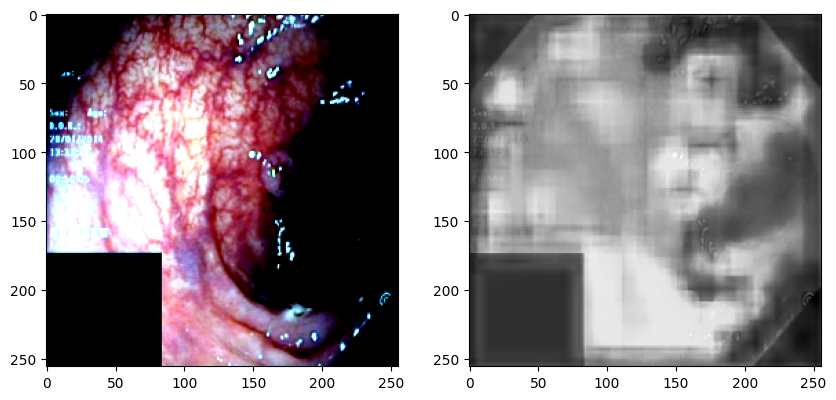

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


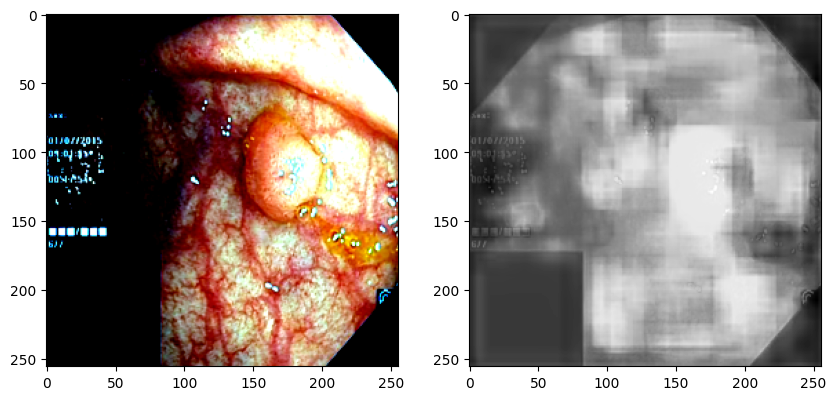

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


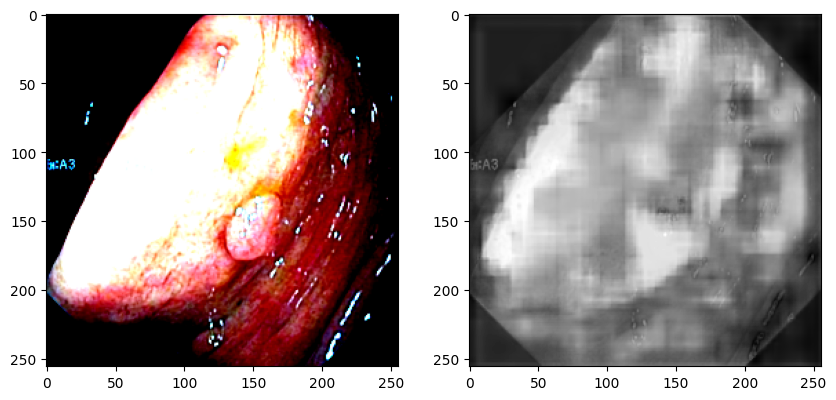

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


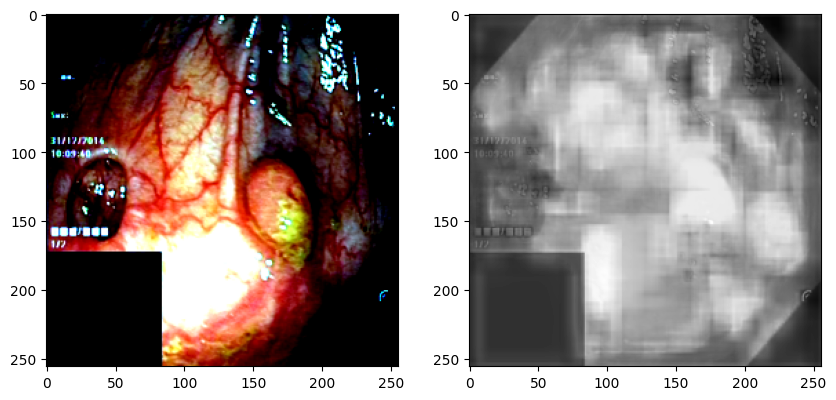

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


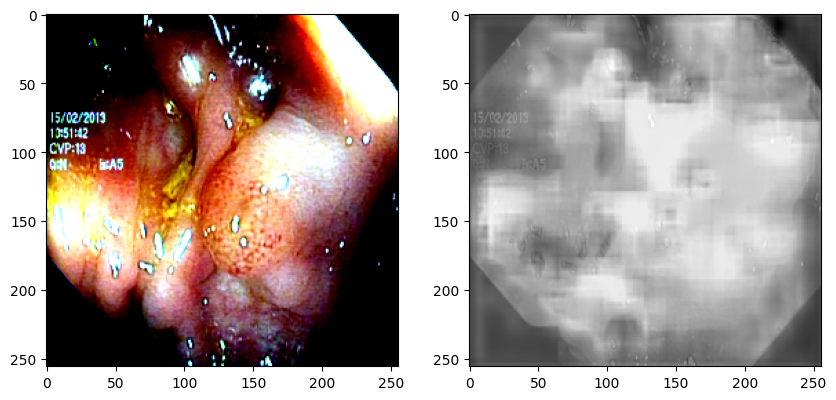

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


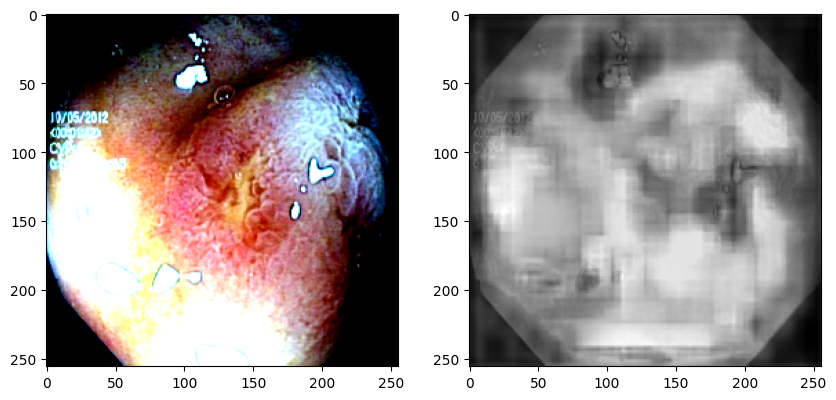

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


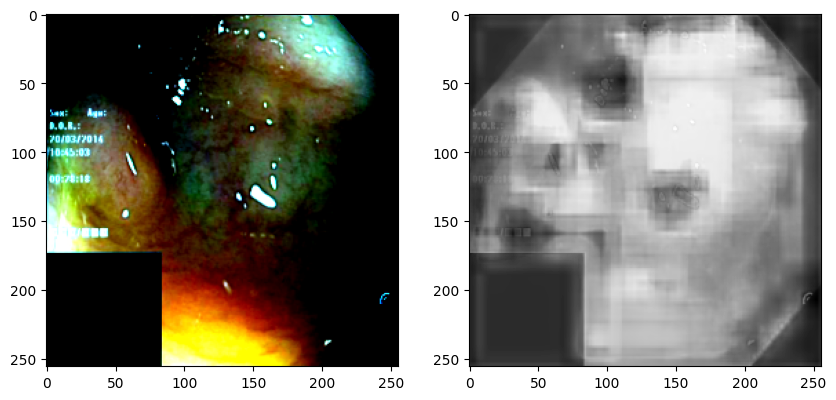

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


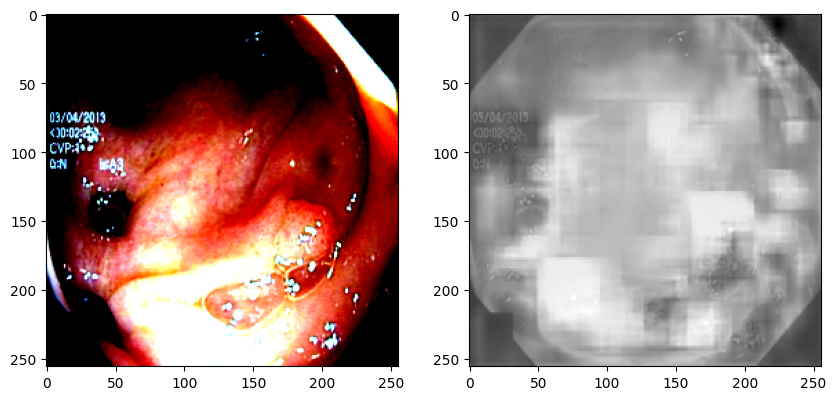

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


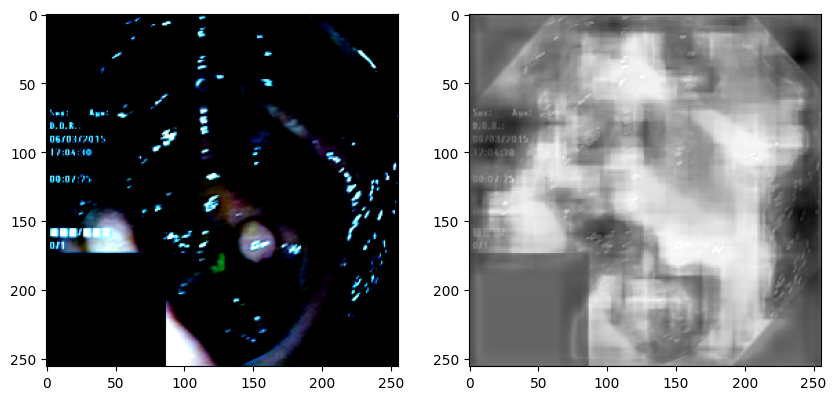

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


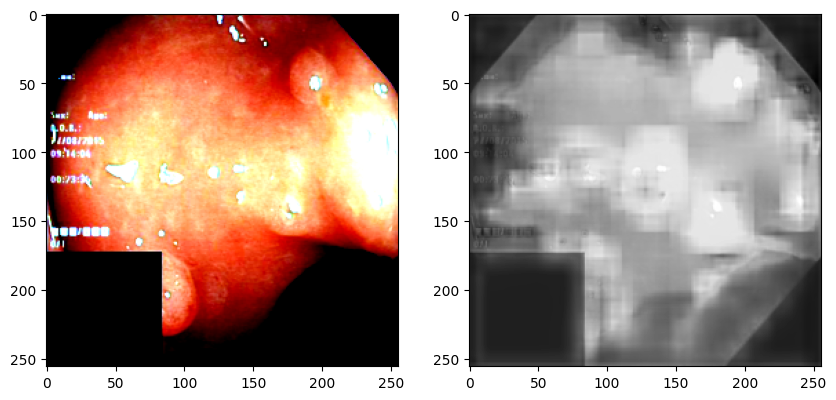

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


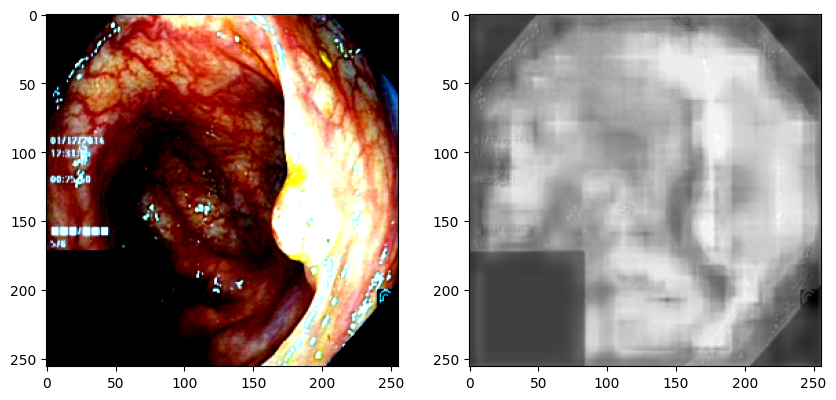

In [23]:
from glob import glob
for img, _ in test_dl:
    img = img.to(device)

    mask = model(img)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 10))

    ax1.imshow(img[0].permute(1, -1, 0).detach().cpu().numpy())
    ax2.imshow(mask[0].permute(1, -1, 0).detach().cpu().numpy(), cmap = 'gray')

    plt.show() 
    plt.close("all") 